# Cell type labeling, plotting, and differential gene expression analysis

# Notebook setup

In [39]:
import os
os.chdir('/local/workdir/dwm269/scCardiacOrganoid/')

In [40]:
from itertools import chain
from itertools import product
import numpy as np
import anndata as ad
import pandas as pd

import scanpy as sc
import scanpy.external as sce

# import scvelo as scv
# import cellrank as cr
import seaborn as sns
from scipy import io
from scipy import sparse

In [41]:
from scripts.py.scantils import *
# from scripts.py.scanplots import *

In [42]:
import gc
gc.enable()

In [43]:
# Load metadata
meta = pd.read_csv("resources/metadata.csv")
meta = meta.loc[meta["source"]=="Hoang et al",]
meta = meta.loc[meta["include"],]
meta.index = list(range(0, len(meta)))
meta

,sample,include,data.dir,pattern,pattern_int,timepoint,time_int,cell_line,source,soupx,soupx_rho_GeneFull
0,D0_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D0,0,GCaMP6f hiPSCs,Hoang et al,False,NaN
1,D1_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D1,1,GCaMP6f hiPSCs,Hoang et al,False,NaN
2,D4_200um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.076
3,D4_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.070
4,D4_1000um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,1000um,1000.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.140
5,D6_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D6,6,GCaMP6f hiPSCs,Hoang et al,True,0.029
6,D8_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D8,8,GCaMP6f hiPSCs,Hoang et al,True,0.015
7,D12_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D12,12,GCaMP6f hiPSCs,Hoang et al,True,0.017
8,D21_200um_B,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.011
9,D21_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.039


## Load in preprocessed data

In [44]:
adata = sc.read_h5ad(
    # filename="data/pyobjs/scCO_v7-4.h5ad"
    filename="data/pyobjs/scCO_v1c.h5ad"
)

# # https://github.com/scverse/scanpy/issues/2239
adata.uns['log1p']["base"] = None 

### Subset cardiac lineage

In [45]:
# tmp_cell_types = ['Cardiac_Mesoderm','Smooth_Muscle', 'Fibroblasts', 'Epicardial', 'Cardiomyocytes'] #'Endocardial',
# adata = adata[adata.obs['cell_types'].isin(tmp_cell_types)]

adata = adata[adata.obs['cell_types_level1'] == "Mesoderm"] 
adata.shape

(41939, 24072)

# DGEA

In [46]:
groupby="cell_types_level2"
sc.tl.rank_genes_groups(
    adata, 
    groupby=groupby, 
    method='wilcoxon',
    layer='data',
    pts=True
)

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [47]:
tmp = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print(tmp.iloc()[1:20,:])

   Cardiac_Mesoderm Cardiomyocytes Endocardial Epicardial Fibroblasts  \
1             DSCAM         SLC8A1       GNG11    S100A10        PRTG   
2        AC107218.3         PDLIM5        FLI1    ZNRF2P2        HAS2   
3             BMPER           RYR2        FLT1      SPARC       TENM4   
4              ROR2            PLN       RAMP2      PHGDH      PTPN13   
5             ELMO1           MYL4         KDR   SLC9A3R1        NPC2   
6              P3H2         CTNNA3        LDB2     COBLL1      TMEM88   
7         LINC00458          MYOM1        TFPI       SOX6         VIM   
8          HS3ST3A1          ACTC1      NCKAP5     TMEM98       KRT19   
9              FBN2         MYBPC3      CALCRL   LEPROTL1       BMPER   
10        LINC01090          TNNI1         RDX      PODXL       CCBE1   
11          DYNC1I1          TNNC1     RASGRP3      KRT18     STEAP1B   
12             HAS2           MYL7        VAV3       KRT8         TNC   
13     RP11-256I9.3         SORBS2       MEF2C     

Write DGEA results to a .csv file

In [48]:
export_dgea_to_csv(
    adata=adata,
    dgea_name='rank_genes_groups',
    n_features=100,
    axis=0,
    csv_out='resources/dgea/mesoderm/scco_v1c_mesoderm_level2.csv'
)

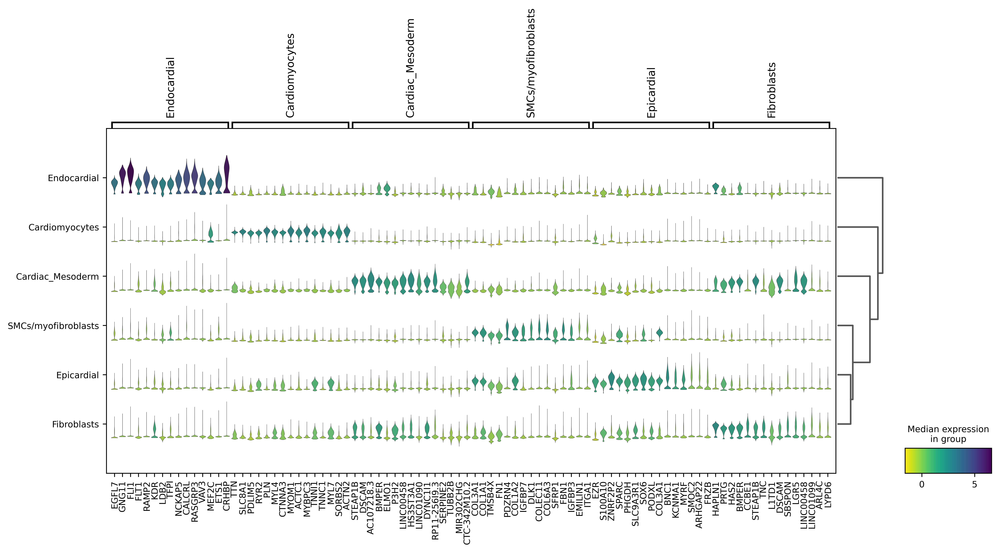

In [49]:
sc.set_figure_params(
    # figsize=(12,16),
    fontsize=10,
    transparent=False,
    # dpi_save=400,
    dpi=300
)

# Rerun dendrogram...
if True:
    sc.tl.dendrogram(
        adata,
        groupby="cell_types_level2",
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.rank_genes_groups_stacked_violin(
    adata,
    n_genes=15,
    min_logfoldchange=2.5,
    cmap='viridis_r',
    # return_fig=True,
    figsize=(15,6)
)

# Plots...

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


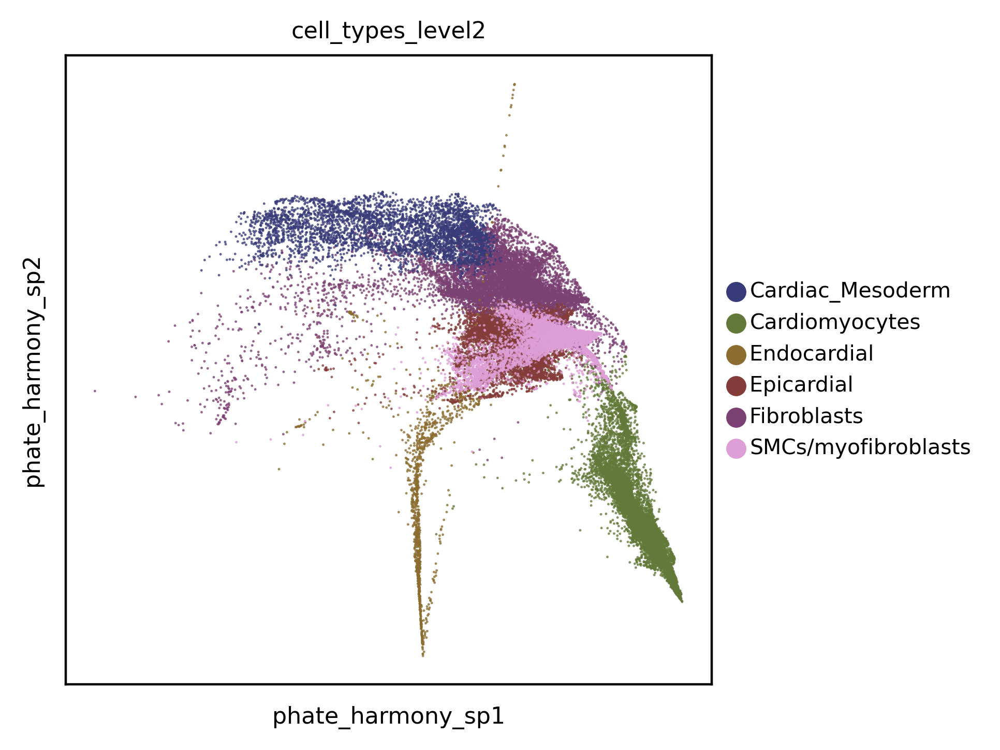

In [50]:
sc.set_figure_params(
    figsize=(4,4),
    fontsize=8,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['leiden_harmony_sp_10_types','pattern'], 
    color=['cell_types_level2'],
    # edges=True, edges_width=0.01, 
    # legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

In [51]:
import phate

In [52]:
phate_operator = phate.PHATE(
    knn=50,
    # decay=10,
    t='auto',
    mds_solver='smacof',
    n_jobs=24
)

# Use top N harmony dims which account for 95% of variance in harmony embedding
n_dims=npcs(adata,reduction="harmony_sp",var_perc=0.80)
print(f"Using {n_dims} dimensions from `harmony_sp`")

tmp_phate = phate_operator.fit_transform(adata.obsm["harmony_sp"][:,:n_dims]) 
adata.obsm['phate_harmony_sp'] = tmp_phate

Using 26 dimensions from `harmony_sp`
Calculating PHATE...
  Running PHATE on 41939 observations and 26 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 96.27 seconds.
    Calculating affinities...
    Calculated affinities in 2.16 seconds.
  Calculated graph and diffusion operator in 99.15 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 18.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 27.06 seconds.
  Calculated landmark operator in 48.18 seconds.
  Calculating optimal t...
    Automatically selected t = 17
  Calculated optimal t in 5.31 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 2.52 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 46.23 seconds.
Calculated PHATE in 201.49 seconds.


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


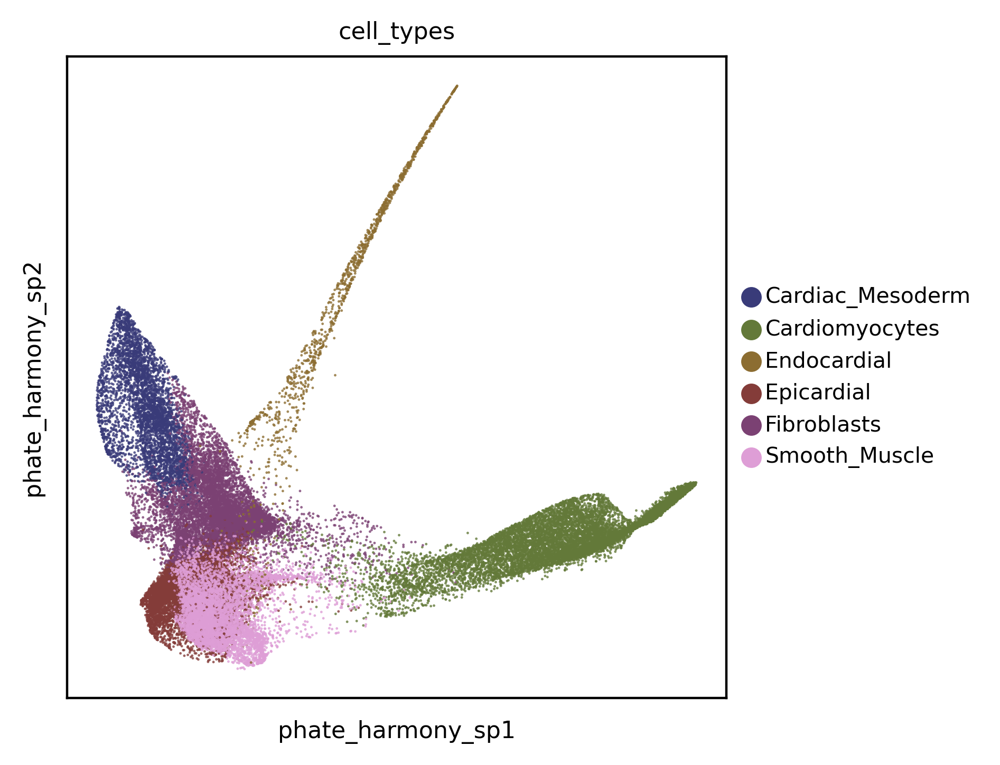

In [53]:
sc.set_figure_params(
    figsize=(4,4),
    fontsize=8,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['leiden_harmony_sp_10_types','pattern'], 
    color=['cell_types'],
    # edges=True, edges_width=0.01, 
    # legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

# Sub-clustering & re-run UMAP

In [54]:
sc.pp.neighbors(
    adata,
    n_neighbors=100,
    n_pcs=50,#npcs(adata,reduction="harmony_sp"),
    use_rep="harmony_sp",
    key_added="harmony_sp_neighbors"
)
gc.collect()

144147

re-cluster after subsetting

In [55]:
for res in [0.8, 1.0, 1.2]:
    sc.tl.leiden(
        adata,
        resolution=res, 
        neighbors_key="harmony_sp_neighbors",
        key_added=f"subclusters_{res}"
    )
    gc.collect()

In [56]:
sc.tl.umap(
    adata,
    neighbors_key="harmony_sp_neighbors"
)

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


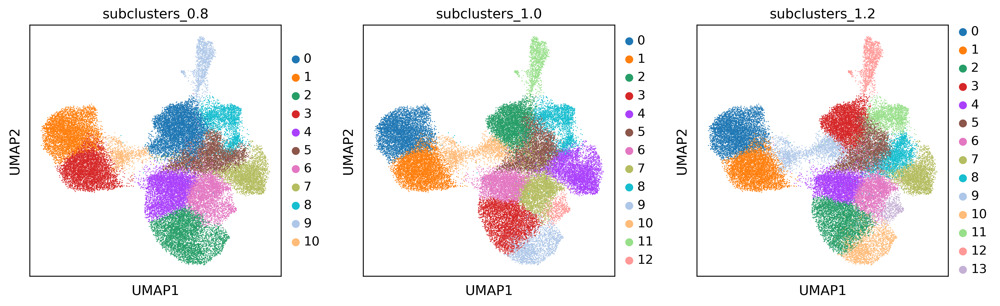

In [57]:
sc.set_figure_params(
    figsize=(4,4),
    fontsize=12,
    transparent=False,
    # dpi_save=400,
    dpi=200
)
sc.pl.umap(
    adata,
    color=[
        # "cell_types_level2",
        f"subclusters_{0.8}",
        f"subclusters_{1.0}",
        f"subclusters_{1.2}"
        # "timepoint","pattern"
    ]
)

In [58]:
groupby=f"subclusters_{0.8}"
sc.tl.rank_genes_groups(
    adata, 
    groupby=groupby, 
    method='wilcoxon',
    layer='data',
    pts=True
)

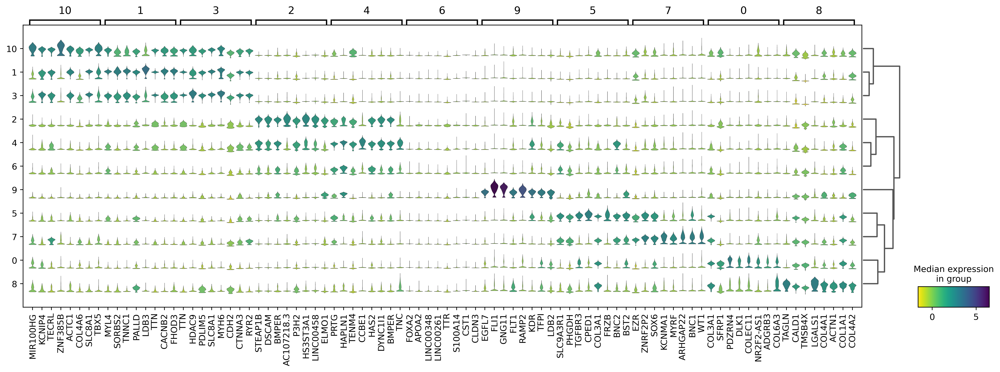

In [59]:
sc.set_figure_params(
    # figsize=(12,16),
    fontsize=12,
    transparent=False,
    # dpi_save=400,
    dpi=200
)
groupby=f"subclusters_{1.0}"
# Rerun dendrogram...
if True:
    sc.tl.dendrogram(
        adata,
        groupby=groupby,
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
    )

sc.pl.rank_genes_groups_stacked_violin(
    adata,
    # groupby=groupby,
    n_genes=8,
    min_logfoldchange=2.5,
    cmap='viridis_r',
    # return_fig=True,
    figsize=(20,6)
)

Dot plot of canonical markers

categories: 0, 1, 2, etc.
var_group_labels: Mesoderm, Progenitors, Fibroblasts, etc.


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


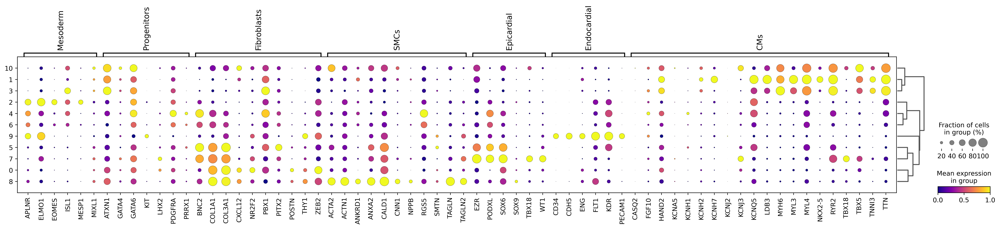

In [60]:
groupby=f"subclusters_{0.8}"

if False: #switch for whether or not to recompute dendrogram...
    sc.tl.dendrogram(
        adata,
        groupby=groupby,
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.dotplot(
    adata,
    var_names=read_csv_to_dict(
        "resources/gene_lists/gene_markers_mesodermal.csv",
        names2check = adata.var_names
    ),
    groupby=groupby,
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

Annotate the clusters from res.0.8

In [61]:
# Low-level clustering, 
old_to_new = {
    '0':'Myofibroblasts',
    '1':'Cardiomyocytes (NKX2.5+)',
    '2':'Cardiac_Mesoderm',
    '3':'Cardiomyocytes (ISL1+)',
    '4':'Cardiac Progenitors',
    '5':'Fibroblasts',
    '6':'Cardiac Progenitors',
    '7':'Epicardial',
    '8':'SMCs',
    '9':'Endocardial',
    '10':'Cardiomyocyte (early)'
}
adata.obs[f"subclusters_{0.8}_anno"] = (
    adata.obs[f"subclusters_{0.8}"].map(old_to_new).astype('category')
)
adata.obs[f"subclusters_{0.8}_anno"].value_counts()

Cardiac Progenitors         8765
Myofibroblasts              6295
Cardiomyocytes (NKX2.5+)    5129
Cardiac_Mesoderm            5024
Cardiomyocytes (ISL1+)      4904
Fibroblasts                 4052
Epicardial                  3117
SMCs                        2402
Endocardial                 1280
Cardiomyocyte (early)        971
Name: subclusters_0.8_anno, dtype: int64

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


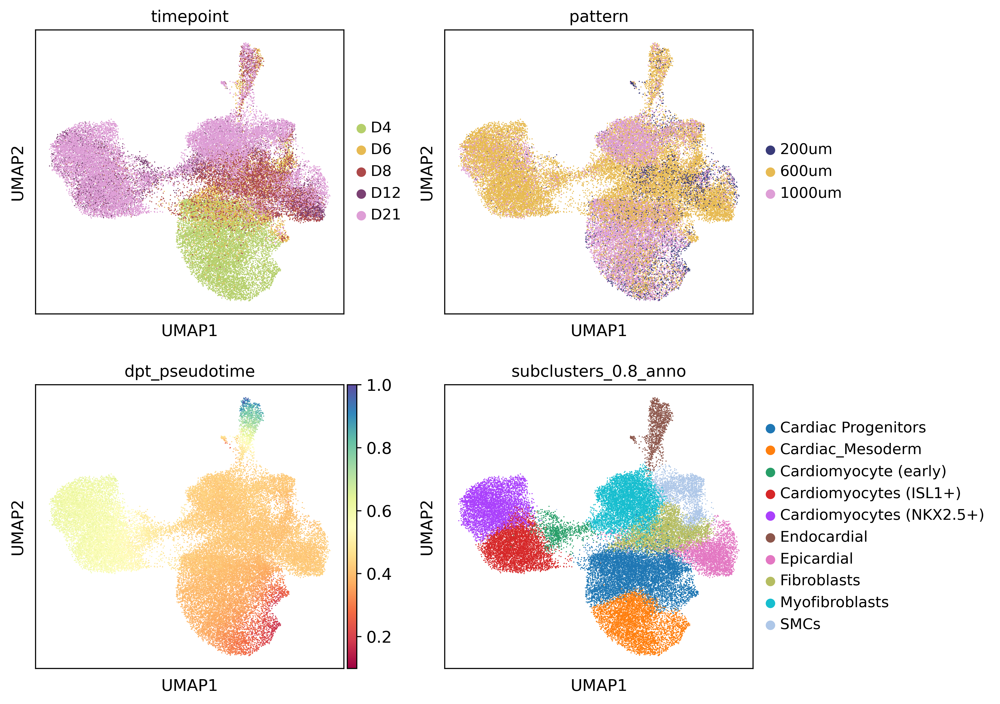

In [62]:
sc.set_figure_params(
    figsize=(4,4),
    fontsize=12,
    transparent=False,
    # dpi_save=400,
    dpi=200
)
sc.pl.umap(
    adata,
    cmap="Spectral",
    ncols=2,
    color=[
        "timepoint","pattern",
        "dpt_pseudotime",
        f"subclusters_{0.8}_anno"
    ]
)

## Rerun PAGA

In [63]:
sc.tl.paga(
    adata,
    # groups='cell_types_level2',
    groups = f"subclusters_{0.8}_anno",
    neighbors_key='harmony_sp_neighbors'
)

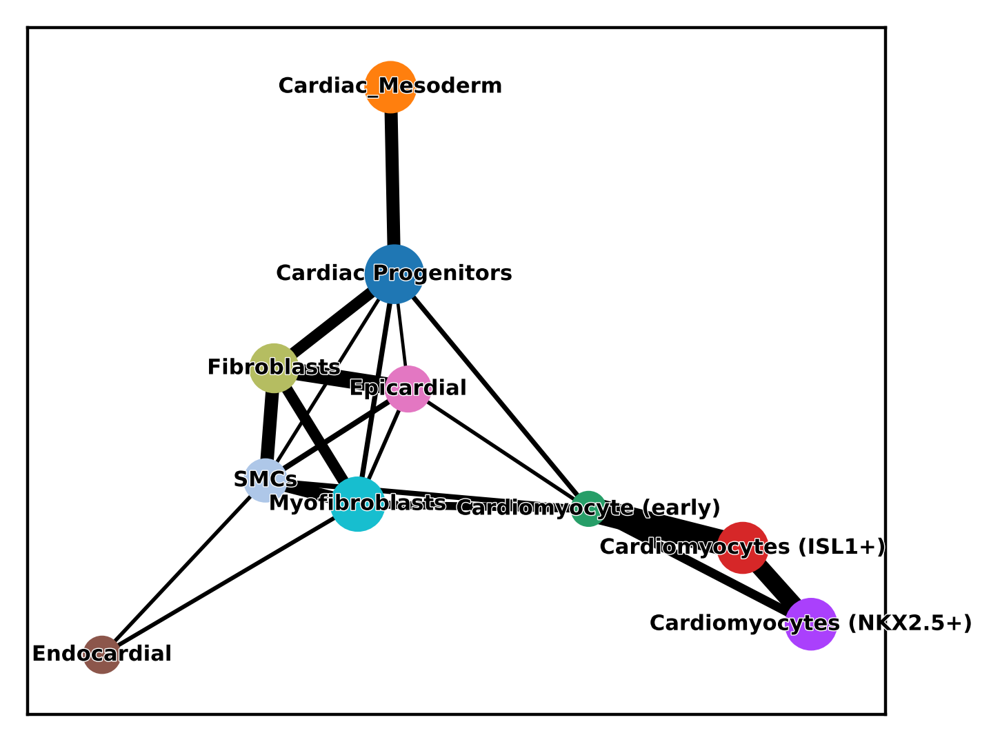

In [64]:
sc.set_figure_params(
    figsize=(4,3),
    fontsize=6,
    transparent=True,
    dpi=200
)
sc.pl.paga(
    adata,
    color=[f"subclusters_{0.8}_anno"],
    threshold=0.1, 
    # normalize_to_color =True,
    # dashed_edges ="connectivities",
    fontoutline=0.5
)

In [65]:
sc.tl.diffmap(
    adata,
    n_comps=25,
    neighbors_key='harmony_sp_neighbors'
)

In [66]:
sc.tl.draw_graph(
    adata, 
    neighbors_key='harmony_sp_neighbors',
    layout='fa', 
    init_pos='paga'
)

Re-compute pseudotime

In [67]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_types_level2']  == 'Cardiac_Mesoderm')[0]

In [68]:
sc.tl.dpt(
    adata,
    # n_branchings=1,
    neighbors_key='harmony_sp_neighbors'
)

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


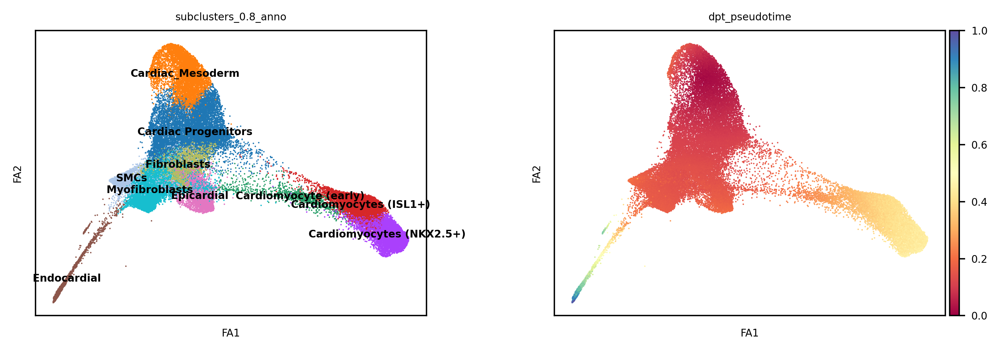

In [69]:
sc.pl.draw_graph(
    adata, color=[
    f"subclusters_{0.8}_anno",
    'dpt_pseudotime'
    ], 
    cmap = 'Spectral',
    legend_loc='on data'
)

## Save .h5ad for downstream analyses

In [70]:
adata.write_h5ad(
    filename="data/pyobjs/mesoderm_2a.h5ad"
)

### DGEA

In [71]:
sc.tl.rank_genes_groups(
    adata,
    groupby='timepoint', 
    method='wilcoxon',
    layer='data',
    pts=True
)

In [72]:
tmp = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print(tmp.iloc()[1:20,:])

               D4        D6        D8      D12     D21
1           DSCAM    TMEM88      BST2   CAMK2D    NFIB
2            HAS2    IGDCC3      LIFR   ATP2A2     PLN
3           BMPER   S100A10   ZNRF2P2     RYR2   FBXL7
4       LINC00458      PRTG    TMEM98    EMC10    NREP
5        HS3ST3A1    HAPLN1     SPARC    CHRM2   CHRM2
6            P3H2   SIPA1L2    PLXNA2   SLC8A1   GAPDH
7          HAPLN1     PHGDH     PHGDH   MT-ND4  PDLIM5
8         DYNC1I1  SLC9A3R1       EZR   PDLIM5  MALAT1
9           L1TD1      BNC2  LEPROTL1  CACNA1D  SLC8A1
10         FAM89A     CALD1   SEPTIN7   KIF13A  COL4A2
11           LGR5     KRT19    COL3A1    KANK1  SORBS2
12           PRTG      STAC    COL1A2    FHOD3    NFIA
13          ALPK2     PTCH1    KCTD12     MYH6   ESRRG
14   RP11-256I9.3    ATP2B1       FTL     TBX5    MLIP
15          TENM4     BMPER    COL1A1    MAGI2   MYOM1
16         CRABP2    ANKS1A       DSP    TANC2    TPM1
17         PTPN13     FREM1       ID2   COL4A5  FILIP1
18        

In [73]:
sc.tl.rank_genes_groups(
    adata, 
    'leiden_harmony_sp_10_types', 
    groups=['cardiac_4'],
    reference='cardiac_12', 
    method='wilcoxon'
)

KeyError: 'leiden_harmony_sp_10_types'

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


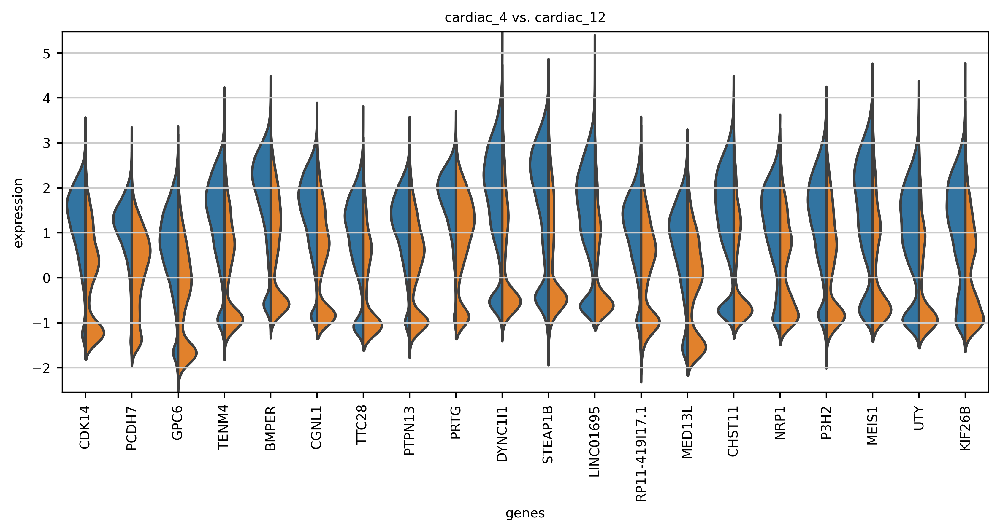

In [ ]:
sc.set_figure_params(
    figsize=(10,4),
    fontsize=8,
    transparent=False,
    dpi=200
)
sc.pl.rank_genes_groups_violin(
    adata, 
    groups='cardiac_4', 
    size=0,
    n_genes=20
)